<a href="https://colab.research.google.com/github/Prabha-krish/Dissertation/blob/main/SRGAN_with_10000_epochs_before_and_after_dataset_increment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mounting preprocessed HR and LR images

In [ ]:
#mounting preprocessed HR & LR dataset into Google Colab
from google.colab import drive
drive.mount('/content/drive')

%cd "/content/drive/MyDrive/Project/Colab Notebooks/preprocessed_images/HR_pre"


Mounted at /content/drive
/content/drive/MyDrive/Project/Colab Notebooks/preprocessed_images/HR_pre


In [ ]:
# reading  HR
#import below libraries
import os   # to work with file paths & directories
import cv2  # image processing
import re   # regular expression matching


# to sort the images in alpha numeric order
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)]
    return sorted(data, key=alphanum_key)
HR_path = '/content/drive/MyDrive/Project/Colab Notebooks/preprocessed_images/HR_pre'
Pre_HR = sorted_alphanumeric(os.listdir(HR_path))

# reading images
# array to store images
HR_images = []



for HR_image in Pre_HR:
    if HR_image == 'image_1755.jpg':
        break

    image_path_HR = os.path.join(HR_path, HR_image)
    HR_img = cv2.imread(image_path_HR)
    RGB_HR_img = cv2.cvtColor(HR_img, cv2.COLOR_BGR2RGB)

    HR_images.append(RGB_HR_img)



In [ ]:
%cd "/content/drive/MyDrive/Project/Colab Notebooks/preprocessed_images/LR_pre"

/content/drive/MyDrive/Project/Colab Notebooks/preprocessed_images/LR_pre


In [ ]:
# reading  LR
#import below libraries
import os   # to work with file paths & directories
import cv2  # image processing
import re   # regular expression matching

# to sort the images in alpha numeric order
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)]
    return sorted(data, key=alphanum_key)

LR_path = '/content/drive/MyDrive/Project/Colab Notebooks/preprocessed_images/LR_pre'


Pre_LR = sorted_alphanumeric(os.listdir(LR_path))
# reading images
# array to store images

LR_images = []

for  LR_image in Pre_LR:
    if LR_image == 'image_1755.jpg':
        break

    image_path_LR = os.path.join(LR_path, LR_image)
    LR_img = cv2.imread(image_path_LR)
    RGB_LR_img = cv2.cvtColor(LR_img, cv2.COLOR_BGR2RGB) # color convertion
    LR_images.append(RGB_LR_img)

# Analysing Preprocessed HR and LR images

i)  resized 256-128, 128-64 to feed the model. before got out of memory issue so resized it again.
ii)coverted in to array

In [ ]:
# Resizing HR 256 to 128  by factor 2
scaling_factor = 2  # Scaling
images_HR = []
for image in HR_images:
    down_image = cv2.resize(image, (128, 128), fx=scaling_factor, fy=scaling_factor, interpolation=cv2.INTER_AREA)
    images_HR.append(down_image)

In [ ]:
# checking preprocessed HR size
import numpy as np
#images_HR = [image.astype('float32') / 255.0 for image in images_HR] #performing Min-max normalization for pixel values
images_HR= np.array(images_HR)
height, width, channels = images_HR.shape[:3]
images_HR.shape

(1755, 128, 128, 3)

In [ ]:
# Resizing LR 128 to 64 by factor 2
scaling_factor = 2  # Scaling
images_LR = []
for image in LR_images:
    down_image = cv2.resize(image, (64, 64), fx=scaling_factor, fy=scaling_factor, interpolation=cv2.INTER_AREA)
    images_LR.append(down_image)

In [ ]:
# checking preprocessed LR size
import numpy as np
#images_LR = [image.astype('float32') / 255.0 for image in images_LR] #performning Min-max normalization for pixel values
images_LR= np.array(images_LR) #coverting into array
height, width, channels = images_LR.shape[:3]
images_LR.shape

(1755, 64, 64, 3)

In [ ]:
# checking preprocessed HR (256) size
#import numpy as np
#images_HR = [image.astype('float32') / 255.0 for image in HR_images] #performing Min-max normalization for pixel values
#images_HR= np.array(images_HR) #coverting into array
#height, width, channels = images_HR.shape[:3]
#images_HR.shape

In [ ]:
# checking preprocessed LR size
#import numpy as np
#images_LR = [image.astype('float32') / 255.0 for image in LR_images] #performing Min-max normalization for pixel values
#images_LR= np.array(images_LR)
#height, width, channels = images_LR.shape[:3]
#images_LR.shape

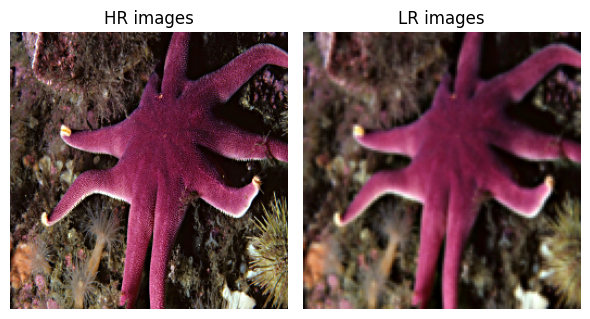

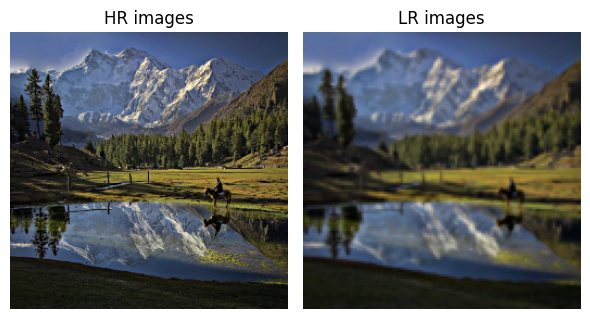

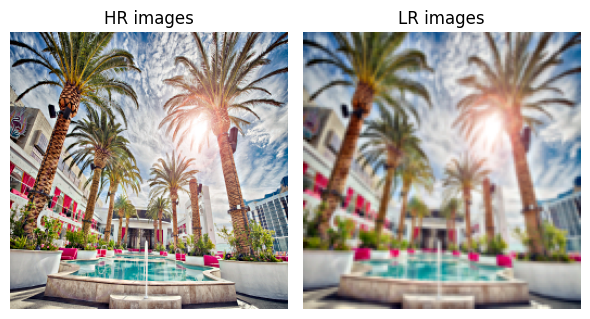

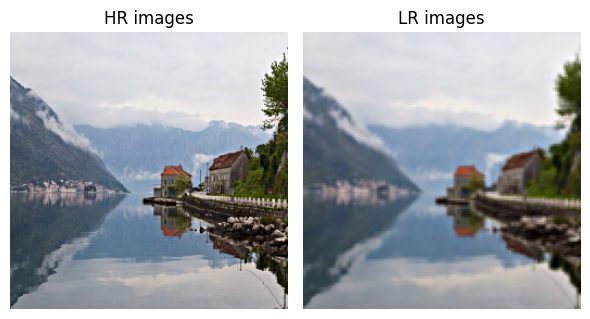

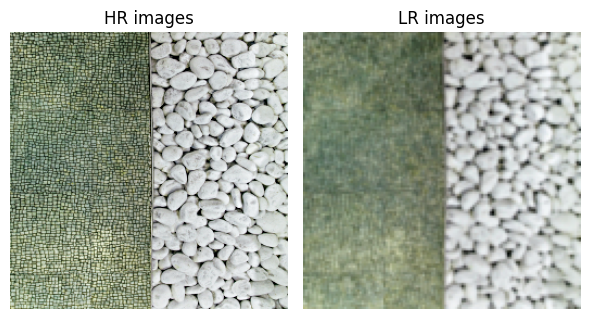

In [ ]:
# image pairing
import matplotlib.pyplot as pt

imgs = 5
for i in range(imgs):
    fig, axes = pt.subplots(1, 2, figsize=(6, 6))
    axes[0].imshow(HR_images[i])
    axes[0].set_title("HR images")
    axes[0].axis("off")

    axes[1].imshow(LR_images[i])
    axes[1].set_title("LR images")
    axes[1].axis("off")

    pt.tight_layout()
    pt.show()


# Random Shuffling of HR and LR images

In [ ]:
#Random shuffling
no_img = images_HR.shape[0]
index = np.arange(no_img)
np.random.shuffle(index)
images_HR = images_HR[index]
images_LR = images_LR[index]

In [ ]:
# Cross checking the Shuffled HR images size
height, width, channels = images_HR.shape[:3]
images_HR.shape

(1755, 128, 128, 3)

In [ ]:
# Cross checking the Shuffled LR images size
height, width, channels = images_LR.shape[:3]
images_LR.shape

(1755, 64, 64, 3)

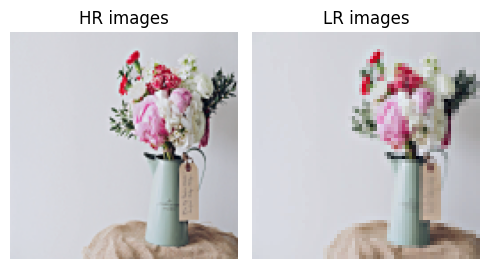

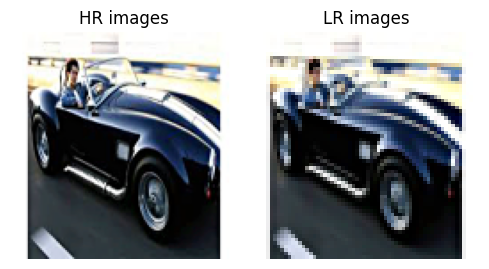

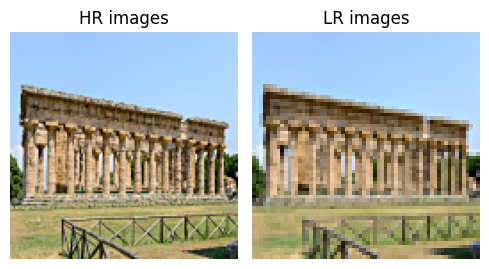

In [ ]:
# image pairing
import matplotlib.pyplot as pt

imgs = 3

for i in range(imgs):
    fig, axes = pt.subplots(1, 2, figsize=(5, 5))
    axes[0].imshow(images_HR[i])
    axes[0].set_title("HR images")
    axes[0].axis("off")

    axes[1].imshow(images_LR[i])
    axes[1].set_title("LR images")
    axes[1].axis("off")

    pt.tight_layout()
    pt.show()

# Spliting the images into Train, Test, Val sets & Dataloadrs to handle the data efficiently

In [ ]:
from sklearn.model_selection import train_test_split
# Train - 70%. Test - 20%, Val- 10%
# HR - Train_HR, Test_HR, Val_HR
# LR - Train_LR, Test_LR, Val_LR
# splitting into Trainval-80% and Test-20 %
HR_trainval, Test_HR, LR_trainval, Test_LR = train_test_split(images_HR, images_LR, test_size=0.2, random_state=42)
# further spliting Trainval into Train-90% val-10%
Train_HR, Val_HR, Train_LR, Val_LR= train_test_split(HR_trainval, LR_trainval, test_size=0.1, random_state=42)

In [ ]:
#Converting train, test and val into arrays
import numpy as np
Train_HR = np.array(Train_HR)
Train_LR = np.array(Train_LR)
Test_HR= np.array(Test_HR)
Test_LR= np.array(Test_LR)
Val_HR= np.array(Val_HR)
Val_LR= np.array(Val_LR)


In [ ]:
# Convert to tensors
import torch
Train_HR = torch.from_numpy(Train_HR)
Train_LR = torch.from_numpy(Train_LR)
Val_HR = torch.from_numpy(Val_HR)
Val_LR = torch.from_numpy(Val_LR)
Test_HR = torch.from_numpy(Test_HR)
Test_LR = torch.from_numpy(Test_LR)

In [ ]:
# checking size of Train , Test and val set
print("HR Train set size:", Train_HR.shape)
print("HR Test set size:", Test_HR.shape)
print("HR Validation set size:", Val_HR.shape)
print("****************************************")
print("LR Train set size:", Train_LR.shape)
print("LR Test set size:", Test_LR.shape)
print("LR Validation set size:", Val_LR.shape)

HR Train set size: torch.Size([1263, 128, 128, 3])
HR Test set size: torch.Size([351, 128, 128, 3])
HR Validation set size: torch.Size([141, 128, 128, 3])
****************************************
LR Train set size: torch.Size([1263, 64, 64, 3])
LR Test set size: torch.Size([351, 64, 64, 3])
LR Validation set size: torch.Size([141, 64, 64, 3])


**Dataloader**

In [ ]:
import torch
from torch.utils.data import DataLoader, TensorDataset

Train_images = TensorDataset(Train_HR, Train_LR) #combining datasets
Val_images = TensorDataset(Val_HR, Val_LR)
Test_images = TensorDataset(Test_HR, Test_LR)

Batch_size = 16

Train_dataloader = DataLoader(Train_images, batch_size =Batch_size, shuffle=True,num_workers=4, pin_memory=True,drop_last=True, prefetch_factor=2,persistent_workers=True)  #loading combined dataset to dataloader data loader is used to feed the model
Val_dataloader = DataLoader(Val_images, batch_size =Batch_size,num_workers=2, pin_memory=True, prefetch_factor=2,persistent_workers=True)
Test_dataloader = DataLoader(Test_images, batch_size=Batch_size,num_workers=2, pin_memory=True,prefetch_factor=2,persistent_workers=True)



In [ ]:
#for batch_ind, (Lr_img, Hr_img) in enumerate(Train_dataloader):
 #   print(f"Lr_img size: {Lr_img.size()}")
  #  print(f"Hr_img size: {Hr_img.size()}")

In [ ]:
print("Train set size:", len(Train_dataloader.dataset))
print("Validation set size:", len(Val_dataloader.dataset))
print("Test set size:", len(Test_dataloader.dataset))

Train set size: 1263
Validation set size: 141
Test set size: 351


# SRGAN Model

**Generator**

In [ ]:
from __future__ import generators
# Genartor using pytroch
import torch
from torch import nn
from torch.nn import init

# B- Residual block- multiple block Conv, BN, PReLu, Cov, BN as one block with K3n64s1, Kernal size 3, filters - 64, stride-1
# Generator - initial cov (k9n64s1), PReLU, Residual block, again conv with BN (k3n64s1), upmsampling block with two conv (k3n256s1), pixelshuffle,PReLu and final conv layer

# B-residual block

class ResidualBlock(nn.Module):
  def __init__(self):
    super(ResidualBlock, self).__init__()
    self.first_conv = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1) #(input_channels, out_channels, kernel_size, stride, padding is to perserve spatial resoultion of input image)
    self.BN1 = nn.BatchNorm2d(64) # 64 features
    self.Prelu = nn.PReLU()
    self.second_conv = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
    self.BN2 = nn.BatchNorm2d(64)

  def forward(self,x):
      res = x
      output = self.first_conv(x)   #x- input tensor, forwarding output of each phase of the block to one to another as input
      output = self.BN1(output)
      output = self.Prelu(output)
      output = self.second_conv(output)
      output = self.BN2(output)
      output +=res
      return output

# Generator
num_res_blocks = 16
upsamp_factor = 2

class Generator(nn.Module):
  def __init__(self):
    super(Generator, self).__init__()
    self.initial_conv = nn.Conv2d(3, 64, kernel_size=9, stride=1, padding=4,bias=False) # input channal - 3 channels(RGB), input image should has 3 channels , k9n64s1
    self.initial_Prelu = nn.PReLU()

    self.res_block = nn.Sequential(*[ResidualBlock() for _ in range(num_res_blocks)])  #helps to apply multiple blocks in squential

    self.another_conv = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1,bias=False) #k3n64s1
    self.another_BN = nn.BatchNorm2d(64)

    self.upsampling_layer = nn.Sequential(
        nn.Conv2d(64, 256, kernel_size=3, stride=1, padding=1, bias=False),  #k3n256s1 , 64 input channel from previous layer
        nn.PixelShuffle(upsamp_factor),
        nn.PReLU(),
        nn.Conv2d(64, 256, kernel_size=3, stride=1, padding=1, bias=False),  #k3n256s1
        nn.PixelShuffle(upsamp_factor),
        nn.PReLU()
    )

    self.output_conv = nn.Conv2d(64, 3, kernel_size=9, stride=1, padding=4,bias=False)   #k9n3s1 64 input channel from previouse layer and output channel is 3 (RGB)
    self._initialize_weights()

  def forward(self,x):
    output = self.initial_conv(x)
    output = self.initial_Prelu(output)

    res = output
    output = self.res_block(output)

    output = self.another_conv(output)
    output = self.another_BN(output)
    output +=res

    output = self.upsampling_layer(output)
    output = self.output_conv(output)

    return output

  def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)


generator = Generator() # creating Generator


In [ ]:
#printing Generator with all layers
#print(generator)

In [ ]:
from torchsummary import summary
#Device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#generator.to(Device)

summary(generator, input_size=(3, 128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]          15,552
             PReLU-2         [-1, 64, 128, 128]               1
            Conv2d-3         [-1, 64, 128, 128]          36,928
       BatchNorm2d-4         [-1, 64, 128, 128]             128
             PReLU-5         [-1, 64, 128, 128]               1
            Conv2d-6         [-1, 64, 128, 128]          36,928
       BatchNorm2d-7         [-1, 64, 128, 128]             128
     ResidualBlock-8         [-1, 64, 128, 128]               0
            Conv2d-9         [-1, 64, 128, 128]          36,928
      BatchNorm2d-10         [-1, 64, 128, 128]             128
            PReLU-11         [-1, 64, 128, 128]               1
           Conv2d-12         [-1, 64, 128, 128]          36,928
      BatchNorm2d-13         [-1, 64, 128, 128]             128
    ResidualBlock-14         [-1, 64, 1

In [ ]:
pip install torchviz

  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4131 sha256=7c8e59dd19025182538b8001e0b3a5af3fe04efb5e3e6ed0122bf88e22ef30f1
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torchviz


**Discriminator**

In [ ]:
#Discriminator
import torch
from torch import nn

# discriminator has 7 blocks with Conv, BN, Leaky ReLU. each block has differnt kernel size, filter and strides,
#like k3n64s2, k3n128s1, k3n128s2, k3n256s1, k3n256s2, k3n512s1, k3n512s2

# network has initital conv,Leaky ReLU, 7 blocks, Dense layer (1024), Leaky ReLU, and dense(1) with sigmoid funtion

# Discriminator block - conv, BN, Leaky ReLU

class DisBlock(nn.Module):
  def __init__(self,input_channels, Feat_maps=64, strides=1):
    super(DisBlock, self).__init__()
    self.conv = nn.Conv2d(input_channels, Feat_maps, kernel_size=3, padding=1, stride=strides, bias=False)
    self.bn = nn.BatchNorm2d(Feat_maps)
    self.leaky_Relu = nn.LeakyReLU(0.2, inplace=True) #alpha value 0.2

  def forward(self, x):
    x = self.conv(x)
    x = self.bn(x)
    x = self.leaky_Relu(x)
    return x

# discrminator

class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()
    self.start_conv = nn.Conv2d(3, 64, kernel_size=3,stride=1, padding=1, bias=False)  #k3n64s1
    self.initial_leakyrelu = nn.LeakyReLU(0.2, inplace=True)

    self.block1 = DisBlock(64, strides=2)                       #k3n64s2 input_channels 64
    self.block2 = DisBlock(64, Feat_maps=128)                   #k3n128s1 input channels-64, stride will defaultly taken as 1
    self.block3 = DisBlock(128, Feat_maps=128, strides=2)       #k3n128s2
    self.block4 = DisBlock(128, Feat_maps=256)                  #k3n256s1
    self.block5 = DisBlock(256, Feat_maps=256, strides=2)       #k3n256s2
    self.block6 = DisBlock(256, Feat_maps=512)                  #k3n512s1
    self.block7 = DisBlock(512, Feat_maps=512, strides=2)       #k3n512s2


    self.last_layers = nn.Sequential(
            nn.AdaptiveAvgPool2d((8, 8)),
            nn.Flatten(),
            nn.Linear(512 * 8 * 8, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 1),
            nn.Sigmoid()
        )


  def forward(self,x):
    x = self.start_conv(x)
    x = self.initial_leakyrelu(x)

    x = self.block1(x)
    x = self.block2(x)
    x = self.block3(x)
    x = self.block4(x)
    x = self.block5(x)
    x = self.block6(x)
    x = self.block7(x)

    output = self.last_layers(x)
    return output


discriminator = Discriminator()  #creating discriminator


In [ ]:
from torchsummary import summary
#Device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#discriminator.to(Device)
summary(discriminator, input_size=(3, 128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           1,728
         LeakyReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3           [-1, 64, 64, 64]          36,864
       BatchNorm2d-4           [-1, 64, 64, 64]             128
         LeakyReLU-5           [-1, 64, 64, 64]               0
          DisBlock-6           [-1, 64, 64, 64]               0
            Conv2d-7          [-1, 128, 64, 64]          73,728
       BatchNorm2d-8          [-1, 128, 64, 64]             256
         LeakyReLU-9          [-1, 128, 64, 64]               0
         DisBlock-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 128, 32, 32]         147,456
      BatchNorm2d-12          [-1, 128, 32, 32]             256
        LeakyReLU-13          [-1, 128, 32, 32]               0
         DisBlock-14          [-1, 128,

In [ ]:
# to check whether model is working ot not
#def test():
  #low_res = 128
  #with torch.cuda.amp.autocast():
    #x = torch.randn((5,3, low_res, low_res))
    #gen = Generator()
    #gen_out = gen(x)
    #dis = Discriminator()
    #dis_out = dis(gen_out)

    #print(gen_out.shape)
    #print(dis_out.shape)
#if __name__=="__main__":
  #test()

**VGG16**- pre-trainined model to extract features. VGG16 is used for smaller dataset, less computational compared to VGG19


In [ ]:
# VGG16
import torch
from torch import nn
import torchvision.models as models

class Pre_VGG16(nn.Module):
  def __init__(self, pretrained=True):
    super(Pre_VGG16, self).__init__()
    Vgg16_model = models.vgg16(pretrained=True)
    self.features = nn.Sequential(*list(Vgg16_model.features.children())[:16])   #extracting 16 layers

    for param in self.features.parameters():
        param.requires_grad = False

  def forward(self,x):
    features = self.features(x)
    return features

def Vgg_build(hr_shape):
  VGG = Pre_VGG16(pretrained = True)
  return VGG

VGG16 = Vgg_build(hr_shape=(3,128, 128))  #creating VGG

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:06<00:00, 80.5MB/s]


In [ ]:
from torchsummary import summary
#Device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#VGG16.to(Device)
summary(VGG16, (3, 128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           1,792
              ReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3         [-1, 64, 128, 128]          36,928
              ReLU-4         [-1, 64, 128, 128]               0
         MaxPool2d-5           [-1, 64, 64, 64]               0
            Conv2d-6          [-1, 128, 64, 64]          73,856
              ReLU-7          [-1, 128, 64, 64]               0
            Conv2d-8          [-1, 128, 64, 64]         147,584
              ReLU-9          [-1, 128, 64, 64]               0
        MaxPool2d-10          [-1, 128, 32, 32]               0
           Conv2d-11          [-1, 256, 32, 32]         295,168
             ReLU-12          [-1, 256, 32, 32]               0
           Conv2d-13          [-1, 256, 32, 32]         590,080
             ReLU-14          [-1, 256,

**Combining all the models** together (Generator, discriminator, VGG16) to train the Generator

In [ ]:
class FinalGan(nn.Module):
  def __init__(self,generator,discriminator,VGG16):
    super(FinalGan, self).__init__()
    self.generator = generator
    self.discriminator = discriminator
    self.vgg16 = VGG16

    for param in self.discriminator.parameters(): # setting discriminator to non-trainable by freezing its parameter
      param.requires_grad = False

  def forward(self,x):
    Generated_image =  self.generator(x)
    Dis_output_image =  self.discriminator(Generated_image)
    vgg16_features =  self.vgg16(Generated_image)
    return Generated_image, Dis_output_image, vgg16_features

Combined_Gan = FinalGan(generator, discriminator, VGG16) #model creation


In [ ]:
for param in Combined_Gan.generator.parameters():
    param.data = param.data.to(torch.float32)

#Training, validation and testing with 10000 epochs for small dataset- Expriment 1

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

#Defining loss
perceptual_loss = nn.MSELoss()   #perceptual calculates mean squared error
adversarial_loss = nn.BCELoss()  #binary cross entrophy

#loading models
generator = Generator()
discriminator = Discriminator()
Vgg16 = Vgg_build(hr_shape=(3, 128, 128))
Combined_Gan = FinalGan(generator, discriminator, VGG16)



#Moving models and loss to device
#Device = torch.device("cuda:0" if torch.cuda.is_available() else "gpu")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator.to(device)
discriminator.to(device)
VGG16.to(device)
Combined_Gan.to(device)
perceptual_loss.to(device)
adversarial_loss.to(device)

#Defining Optimizers for genrator and discriminator
Gen_optimizer = optim.Adam(generator.parameters(), lr = 0.0002, betas = (0.5,0.999))
Disc_optimizer = optim.Adam(discriminator.parameters(), lr = 0.0002, betas = (0.5,0.999))

#optimizer = optim.Adam(list(generator.parameters()) + list(discriminator.parameters()), lr=0.0002, betas=(0.5, 0.999))


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
#Training
import torch.nn.functional as F
import matplotlib.pyplot as pt
epochs = 10000


gen_image_label = torch.zeros((Batch_size, 1),requires_grad=True).to(device)
gt_image_label = torch.ones((Batch_size, 1),requires_grad=True).to(device)

gen_loss = []
dis_loss = []

Combined_Gan.train()    #setting train mode

for epo in range(epochs):      #training over epochs
    accumulated_gen_loss = 0
    accumulated_disc_loss = 0
    for batch_ind, (Hr_img, Lr_img) in enumerate(Train_dataloader):
        Hr_img = Hr_img.to(device)
        Lr_img = Lr_img.to(device)

        Hr_img = Hr_img.to(torch.float32)
        Lr_img = Lr_img.to(torch.float32)

        Hr_img = Hr_img.permute(0, 3, 1, 2)
        Lr_img = Lr_img.permute(0, 3, 1, 2)

        Gen_optimizer.zero_grad()
        Disc_optimizer.zero_grad()

        #print(Lr_img.shape)

#generating HR images
        Generated_images = Combined_Gan.generator(Lr_img) # generating Hr images by inputing Lr images to generator

#discrminator
        Combined_Gan.discriminator.train()                 #setting Discriminator for training

        disc_loss_Genimage = adversarial_loss(Combined_Gan.discriminator(Generated_images .detach()), gen_image_label) #calculate discriminator loss on generated images
        disc_loss_gtimage = adversarial_loss(Combined_Gan.discriminator(Hr_img), gt_image_label)                        #calculate discriminator loss on ground truth hr images
        disc_loss = 0.5 * (disc_loss_Genimage + disc_loss_gtimage)   #total loss calculation

        disc_loss.backward()  #updating discriminator based on its loss
        Disc_optimizer.step()

        Combined_Gan.discriminator.eval()  # discrminator for evalution

 # resizing target tensor to match the size of input tensor - got mismatch error.
        Hr_img_resized = F.interpolate(Hr_img, size=Generated_images.shape[2:], mode='bilinear', align_corners=False)
#generator loss calculation and updating parameters
        gen_loss_genimage = adversarial_loss(Combined_Gan.discriminator(Generated_images), gt_image_label)
        gen_loss_perceptual = perceptual_loss(Combined_Gan.vgg16(Generated_images), Combined_Gan.vgg16(Hr_img_resized))
        #Gen_loss.requires_grad =True
        Gen_loss = gen_loss_genimage + 0.001 * gen_loss_perceptual

        Gen_loss.backward()
        Gen_optimizer.step()

        accumulated_gen_loss +=Gen_loss.item()
        accumulated_disc_loss += disc_loss.item()


        Avg_gen_loss = accumulated_gen_loss / len(Train_dataloader)
        Avg_dis_loss = accumulated_disc_loss/ len(Train_dataloader)

        gen_loss.append(Avg_gen_loss)
        dis_loss.append(Avg_dis_loss)

    print(f"Epoch [{epo + 1}/{epochs}], Generator Loss: {Avg_gen_loss:.4f}")
    print(f"Epoch [{epo + 1}/{epochs}], Discriminator Loss: {Avg_dis_loss:.4f}")


pt.figure(figsize=(10, 5))
pt.plot(range(1, epochs + 1), gen_loss, label='Generator Loss')
pt.plot(range(1, epochs + 1), dis_loss, label='Discriminator Loss')
pt.xlabel('Epochs')
pt.ylabel('Loss')
pt.title('Generator and Discriminator Loss Curves')
pt.legend()
pt.show()

Streaming output truncated to the last 5000 lines.
Epoch [7501/10000], Generator Loss: 0.8041
Epoch [7501/10000], Discriminator Loss: 1.2494
Epoch [7502/10000], Generator Loss: 0.8040
Epoch [7502/10000], Discriminator Loss: 1.2494
Epoch [7503/10000], Generator Loss: 0.8040
Epoch [7503/10000], Discriminator Loss: 1.2494
Epoch [7504/10000], Generator Loss: 0.8040
Epoch [7504/10000], Discriminator Loss: 1.2494
Epoch [7505/10000], Generator Loss: 0.8039
Epoch [7505/10000], Discriminator Loss: 1.2494
Epoch [7506/10000], Generator Loss: 0.8039
Epoch [7506/10000], Discriminator Loss: 1.2494
Epoch [7507/10000], Generator Loss: 0.8038
Epoch [7507/10000], Discriminator Loss: 1.2494
Epoch [7508/10000], Generator Loss: 0.8038
Epoch [7508/10000], Discriminator Loss: 1.2494
Epoch [7509/10000], Generator Loss: 0.8038
Epoch [7509/10000], Discriminator Loss: 1.2495
Epoch [7510/10000], Generator Loss: 0.8037
Epoch [7510/10000], Discriminator Loss: 1.2495
Epoch [7511/10000], Generator Loss: 0.8037
Epoch 

In [ ]:
#Validation
import torch
import numpy as np
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from sklearn.metrics import mean_squared_error, mean_absolute_error

Combined_Gan.generator.eval()
Val_loss = 0.0
PSNR = 0.0
SSIM = 0.0
MSE = 0.0
MAE= 0.0

#with torch.no_grad():
for batch_ind, ( Hr_img, Lr_img) in enumerate(Val_dataloader):
        Hr_img = Hr_img.to(device)
        Lr_img = Lr_img.to(device)

        Hr_img = Hr_img.to(torch.float32) #converting input to torch float
        Lr_img = Lr_img.to(torch.float32)

        Hr_img = Hr_img.permute(0, 3, 1, 2)
        Lr_img = Lr_img.permute(0, 3, 1, 2)

        Gen_img = Combined_Gan.generator(Lr_img) # generating hr

        # resizing target tensor to match the size of input tensor - got mismatch error.
        Hr_img_resizedd = F.interpolate(Hr_img, size=Gen_img.shape[2:], mode='bilinear', align_corners=False)

        Val_loss += perceptual_loss(Combined_Gan.vgg16(Gen_img), Combined_Gan.vgg16(Hr_img_resizedd)).item() # calculate validation loss for features of generated and Ground truth hr

        for i in range(len(Lr_img)):
            gen_img = np.array(TF.to_pil_image(Gen_img[i].cpu())) #converting images as PIL images
            Hr_img_resizedd1 = np.array(TF.to_pil_image(Hr_img_resizedd[i]))

            if gen_img.shape != Hr_img_resizedd1.shape:
            # Resize Hr_img_resizedd to match the shape of gen_img
              Hr_img_resizedd1 = Hr_img_resizedd1.resize((gen_img.shape[1], gen_img.shape[0]))

              #print(f"Hr_img_resizedd shape: {Hr_img_resizedd.shape}")
              #print(f"gen_img shape: {gen_img.shape}")

            Psnr_score = peak_signal_noise_ratio(Hr_img_resizedd1, gen_img, data_range=255) # PSNR calculation
            PSNR += Psnr_score

            Ssim_score = structural_similarity(Hr_img_resizedd1, gen_img, channel_axis=2) # calculate SSIM
            SSIM += Ssim_score

            #reshaping images to have same dimension because got error - Found array with dim 3. None expected <= 2.
            #gen_img = np.squeeze(gen_img)
            #Hr_img_resizedd  = np.squeeze(Hr_img_resizedd )
 #flatteing image to have the shpae

            gen_imgg = gen_img.flatten()
            Hr_imgg_resizedd = Hr_img_resizedd1.flatten()

            Mse_score = mean_squared_error(Hr_imgg_resizedd, gen_imgg)  # MSE
            MSE += Mse_score

            Mae_score = mean_absolute_error(Hr_imgg_resizedd, gen_imgg)  #MAE
            MAE += Mae_score

num_sample = len(Val_dataloader.dataset) #checking no of samples
Val_loss /= num_sample
Psnr_avg_score = PSNR / num_sample
Ssim_avg_score = SSIM / num_sample
Mse_avg_score =  MSE / num_sample
Mae_avg_score =  MAE / num_sample

print(f"Validation perceptual Loss: {Val_loss :.4f}")
print(f"Average PSNR: {Psnr_avg_score:.2f}")
print(f"Average SSIM: {Ssim_avg_score:.4f}")
print(f"Average MSE: {Mse_avg_score:.2f}")
print(f"Average MAE: {Mae_avg_score:.2f}")


Validation perceptual Loss: 206.1091
Average PSNR: 7.68
Average SSIM: 0.0056
Average MSE: 105.48
Average MAE: 127.49


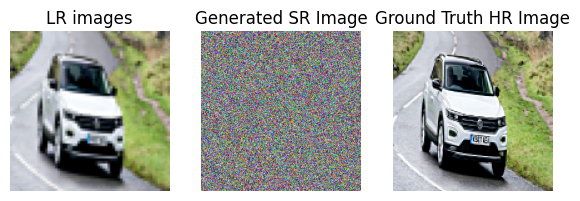

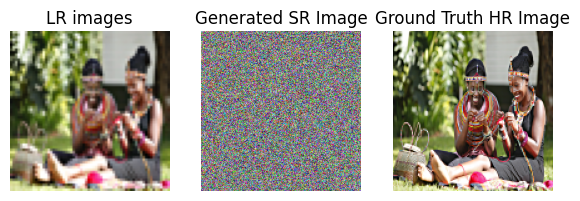

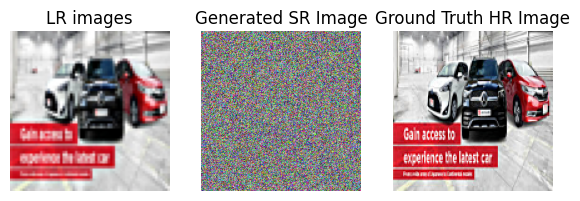

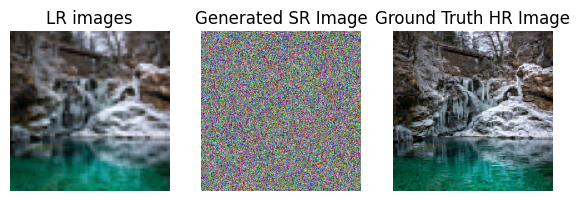

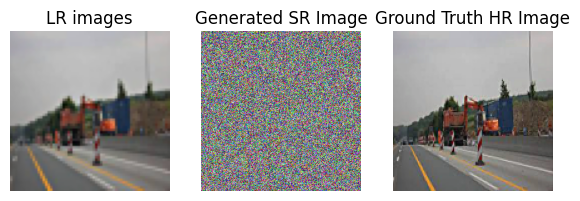

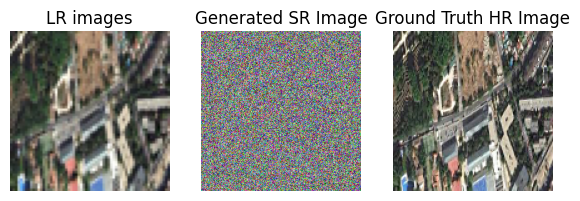

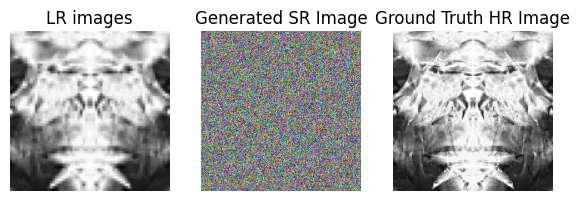

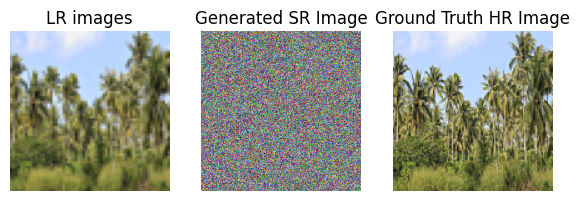

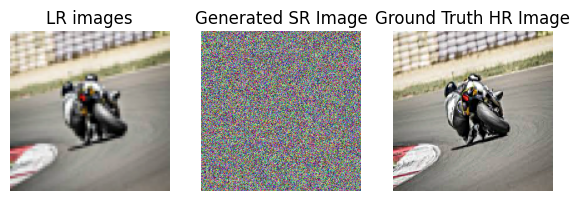

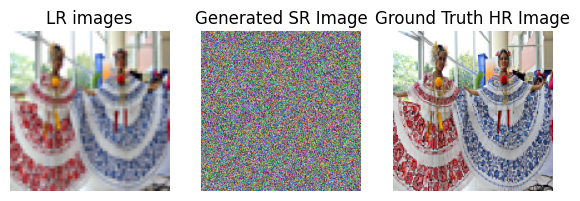

In [ ]:
#Testing
import torch
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
import numpy as np

Combined_Gan.generator.eval()
disp_img =0
#with torch.no_grad():
for i, (Hr_img,Lr_img ) in enumerate(Test_dataloader):
        Hr_img = Hr_img.to(device)
        Lr_img = Lr_img.to(device)

        Hr_img = Hr_img.to(torch.float32) #converting input to torch float
        Lr_img = Lr_img.to(torch.float32)

        Hr_img = Hr_img.permute(0, 3, 1, 2)
        Lr_img = Lr_img.permute(0, 3, 1, 2)


        Gen_img = Combined_Gan.generator(Lr_img) # generating hr

        #Gen_img = Gen_img.to(device)
        #Gen_img = Gen_img.to(torch.float32)
        #Gen_img= Gen_img.permute(0, 3, 1, 2)

        for j in range(len(Lr_img)):
          if disp_img >= 10:
                break
          lr_img = TF.to_pil_image(Lr_img[j].cpu()).convert("RGB")
          hr_img = TF.to_pil_image(Hr_img[j].cpu()).convert("RGB")
          gen_img = TF.to_pil_image(Gen_img[j].cpu()).convert("RGB")

#Postprocessing - denormalization
          lr_img = np.array(lr_img) *255.0
          hr_img = np.array(hr_img) *255.0
          gen_img = np.array(gen_img) * 255.0


          #lr_img = np.clip(lr_img, 0, 255)
          #hr_img = np.clip(hr_img, 0, 255)
          #gen_img = np.clip(gen_img, 0, 255)

          lr_img = lr_img.astype(np.uint8)
          hr_img = hr_img.astype(np.uint8)
          gen_img = gen_img.astype(np.uint8)


#reshaping
          #lr_img = lr_img.reshape(lr_img.shape[0], lr_img.shape[1], -1)
          #hr_img = hr_img.reshape(hr_img.shape[0], hr_img.shape[1], -1)
          #gen_img = gen_img.reshape(gen_img.shape[0], gen_img.shape[1], -1)



          fig, axs = plt.subplots(1, 3, figsize=(7, 7))
          axs[0].imshow(lr_img)
          axs[0].axis('off')
          axs[0].set_title('LR images')
          axs[1].imshow(gen_img)
          axs[1].axis('off')
          axs[1].set_title('Generated SR Image')
          axs[2].imshow(hr_img)
          axs[2].axis('off')
          axs[2].set_title('Ground Truth HR Image')
          plt.show()
          disp_img += 1

        if disp_img >= 10:
            break


In [ ]:
pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.5/605.5 kB 16.1 MB/s eta 0:00:00


# Training, validation and testing after adding images with 10000 epochs - expriment 2

1) Defining Loss, optimizers and moving models and loss funtions to device for efficient GPU utilisation 2) Hyper parameter tuning - learning rate schdulers Learning rate adjustment and learning rate schduler with step size 5 3) Training with 10000 epochs after combining datasets

In [ ]:
#Definging loss and optimizers
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
#Defining loss
perceptual_loss = nn.MSELoss()   #perceptual calculates mean squared error
adversarial_loss = nn.BCELoss()  #binary cross entrophy

#loading models
generator = Generator()
discriminator = Discriminator()
Vgg16 = Vgg_build(hr_shape=(3, 128, 128))
Combined_Gan = FinalGan(generator, discriminator, VGG16)



#Moving models and loss to device
#Device = torch.device("cuda:0" if torch.cuda.is_available() else "gpu")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator.to(device)
discriminator.to(device)
VGG16.to(device)
Combined_Gan.to(device)
perceptual_loss.to(device)
adversarial_loss.to(device)

#Defining Optimizers for genrator and discriminator
Gen_optimizer = optim.Adam(generator.parameters(), lr = 0.0003, betas = (0.9,0.999))
Disc_optimizer = optim.Adam(discriminator.parameters(), lr = 0.0004, betas = (0.9,0.999))

#optimizer = optim.Adam(list(generator.parameters()) + list(discriminator.parameters()), lr=0.0002, betas=(0.5, 0.999))

gen_scheduler = StepLR(Gen_optimizer, step_size=5, gamma=0.5)
disc_scheduler = StepLR(Disc_optimizer, step_size=5, gamma=0.5)


Streaming output truncated to the last 5000 lines.
Epoch [7501/10000], Generator Loss: 3.7450
Epoch [7501/10000], Discriminator Loss: 0.7228
Epoch [7502/10000], Generator Loss: 3.7256
Epoch [7502/10000], Discriminator Loss: 0.7222
Epoch [7503/10000], Generator Loss: 3.7376
Epoch [7503/10000], Discriminator Loss: 0.7224
Epoch [7504/10000], Generator Loss: 3.7236
Epoch [7504/10000], Discriminator Loss: 0.7223
Epoch [7505/10000], Generator Loss: 3.7490
Epoch [7505/10000], Discriminator Loss: 0.7229
Epoch [7506/10000], Generator Loss: 3.7345
Epoch [7506/10000], Discriminator Loss: 0.7229
Epoch [7507/10000], Generator Loss: 3.7482
Epoch [7507/10000], Discriminator Loss: 0.7223
Epoch [7508/10000], Generator Loss: 3.7281
Epoch [7508/10000], Discriminator Loss: 0.7225
Epoch [7509/10000], Generator Loss: 3.7431
Epoch [7509/10000], Discriminator Loss: 0.7224
Epoch [7510/10000], Generator Loss: 3.7443
Epoch [7510/10000], Discriminator Loss: 0.7228
Epoch [7511/10000], Generator Loss: 3.7434
Epoch 

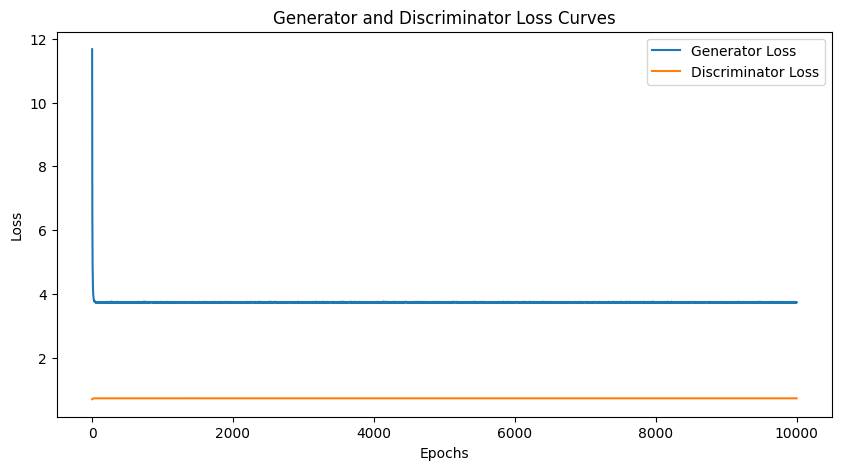

In [ ]:
#Training
import torch.nn.functional as F
import matplotlib.pyplot as pt
import torch.nn.utils as utils
epochs = 10000


gen_image_label = torch.zeros((Batch_size, 1),requires_grad=True).to(device)
gt_image_label = torch.ones((Batch_size, 1),requires_grad=True).to(device)


gen_loss = []
dis_loss = []

Combined_Gan.train()    #setting train mode

for epo in range(epochs):      #training over epochs
    accumulated_gen_loss = 0
    accumulated_disc_loss = 0
    for batch_ind, (Hr_img, Lr_img) in enumerate(Train_dataloader):
        Hr_img = Hr_img.to(device)
        Lr_img = Lr_img.to(device)

        Hr_img = Hr_img.to(torch.float32)
        Lr_img = Lr_img.to(torch.float32)

        Hr_img = Hr_img.permute(0, 3, 1, 2)
        Lr_img = Lr_img.permute(0, 3, 1, 2)

        Gen_optimizer.zero_grad()
        Disc_optimizer.zero_grad()

        #print(Lr_img.shape)

#generating HR images
        Generated_images = Combined_Gan.generator(Lr_img) # generating Hr images by inputing Lr images to generator
         # resizing target tensor to match the size of input tensor - got mismatch error.
        Hr_img_resized = F.interpolate(Hr_img, size=Generated_images.shape[2:], mode='bilinear', align_corners=False)

#discrminator
        Combined_Gan.discriminator.train()                 #setting Discriminator for training

        disc_loss_Genimage = adversarial_loss(Combined_Gan.discriminator(Generated_images .detach()), gen_image_label) #calculate discriminator loss on generated images
        disc_loss_gtimage = adversarial_loss(Combined_Gan.discriminator(Hr_img), gt_image_label)                        #calculate discriminator loss on ground truth hr images
        disc_loss = 0.5 * (disc_loss_Genimage + disc_loss_gtimage)   #total loss calculation

        disc_loss.backward()  #updating discriminator based on its loss
        Disc_optimizer.step()

        Combined_Gan.discriminator.eval()  # discrminator for evalution


#generator loss calculation and updating parameters
        gen_loss_genimage = adversarial_loss(Combined_Gan.discriminator(Generated_images), gt_image_label)
        gen_loss_perceptual = perceptual_loss(Combined_Gan.vgg16(Generated_images), Combined_Gan.vgg16(Hr_img_resized))
        #Gen_loss.requires_grad =True
        Gen_loss = gen_loss_genimage + 0.001 * gen_loss_perceptual

        Gen_loss.backward()
        max_norm = 1.0
        utils.clip_grad_norm_(generator.parameters(), max_norm)
        Gen_optimizer.step()

        accumulated_gen_loss += Gen_loss.item()
        accumulated_disc_loss += disc_loss.item()

    Avg_gen_loss = accumulated_gen_loss / len(Train_dataloader)
    Avg_dis_loss = accumulated_disc_loss / len(Train_dataloader)

    gen_loss.append(Avg_gen_loss)
    dis_loss.append(Avg_dis_loss)

    print(f"Epoch [{epo + 1}/{epochs}], Generator Loss: {Avg_gen_loss:.4f}")
    print(f"Epoch [{epo + 1}/{epochs}], Discriminator Loss: {Avg_dis_loss:.4f}")

    gen_scheduler.step()
    disc_scheduler.step()

pt.figure(figsize=(10, 5))
pt.plot(range(1, epochs + 1), gen_loss, label='Generator Loss')
pt.plot(range(1, epochs + 1), dis_loss, label='Discriminator Loss')
pt.xlabel('Epochs')
pt.ylabel('Loss')
pt.title('Generator and Discriminator Loss Curves')
pt.legend()
pt.show()

In [ ]:
#Validation
import torch
import numpy as np
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from sklearn.metrics import mean_squared_error, mean_absolute_error

Combined_Gan.generator.eval()
Val_loss = 0.0
PSNR = 0.0
SSIM = 0.0
MSE = 0.0
MAE= 0.0

#with torch.no_grad():
for batch_ind, ( Hr_img, Lr_img) in enumerate(Val_dataloader):
        Hr_img = Hr_img.to(device)
        Lr_img = Lr_img.to(device)

        Hr_img = Hr_img.to(torch.float32) #converting input to torch float
        Lr_img = Lr_img.to(torch.float32)

        Hr_img = Hr_img.permute(0, 3, 1, 2)
        Lr_img = Lr_img.permute(0, 3, 1, 2)

        Gen_img = Combined_Gan.generator(Lr_img) # generating hr

        # resizing target tensor to match the size of input tensor - got mismatch error.
        Hr_img_resizedd = F.interpolate(Hr_img, size=Gen_img.shape[2:], mode='bilinear', align_corners=False)

        Val_loss += perceptual_loss(Combined_Gan.vgg16(Gen_img), Combined_Gan.vgg16(Hr_img_resizedd)).item() # calculate validation loss for features of generated and Ground truth hr

        for i in range(len(Lr_img)):
            gen_img = np.array(TF.to_pil_image(Gen_img[i].cpu())) #converting images as PIL images
            Hr_img_resizedd1 = np.array(TF.to_pil_image(Hr_img_resizedd[i]))

            if gen_img.shape != Hr_img_resizedd1.shape:
            # Resize Hr_img_resizedd to match the shape of gen_img
              Hr_img_resizedd1 = Hr_img_resizedd1.resize((gen_img.shape[1], gen_img.shape[0]))

              #print(f"Hr_img_resizedd shape: {Hr_img_resizedd.shape}")
              #print(f"gen_img shape: {gen_img.shape}")

            Psnr_score = peak_signal_noise_ratio(Hr_img_resizedd1, gen_img, data_range=255) # PSNR calculation
            PSNR += Psnr_score

            Ssim_score = structural_similarity(Hr_img_resizedd1, gen_img, channel_axis=2) # calculate SSIM
            SSIM += Ssim_score

            #reshaping images to have same dimension because got error - Found array with dim 3. None expected <= 2.
            #gen_img = np.squeeze(gen_img)
            #Hr_img_resizedd  = np.squeeze(Hr_img_resizedd )
 #flatteing image to have the shpae

            gen_imgg = gen_img.flatten()
            Hr_imgg_resizedd = Hr_img_resizedd1.flatten()

            Mse_score = mean_squared_error(Hr_imgg_resizedd, gen_imgg)  # MSE
            MSE += Mse_score

            Mae_score = mean_absolute_error(Hr_imgg_resizedd, gen_imgg)  #MAE
            MAE += Mae_score

num_sample = len(Val_dataloader.dataset) #checking no of samples
Val_loss /= num_sample
Psnr_avg_score = PSNR / num_sample
Ssim_avg_score = SSIM / num_sample
Mse_avg_score =  MSE / num_sample
Mae_avg_score =  MAE / num_sample

print(f"Validation perceptual Loss: {Val_loss :.4f}")
print(f"Average PSNR: {Psnr_avg_score:.2f}")
print(f"Average SSIM: {Ssim_avg_score:.4f}")
print(f"Average MSE: {Mse_avg_score:.2f}")
print(f"Average MAE: {Mae_avg_score:.2f}")


Validation perceptual Loss: 216.3669
Average PSNR: 7.62
Average SSIM: 0.0050
Average MSE: 105.51
Average MAE: 127.53


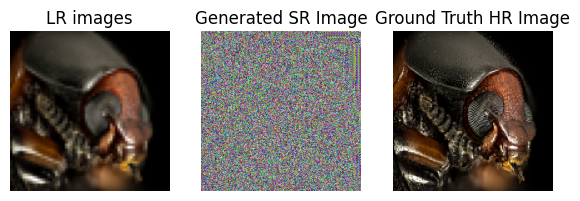

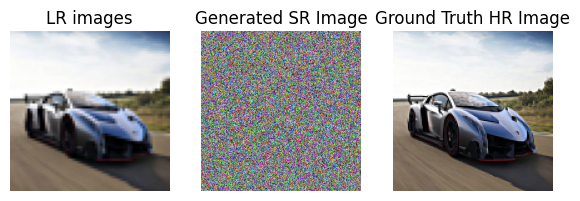

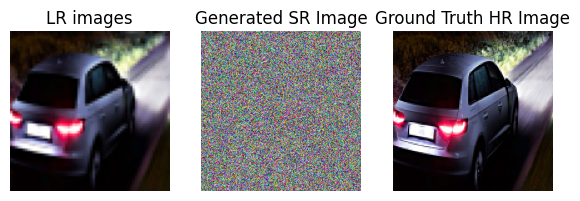

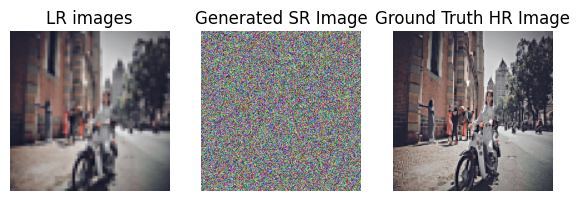

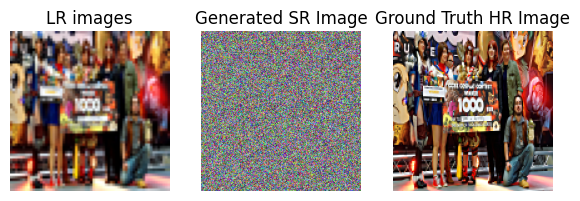

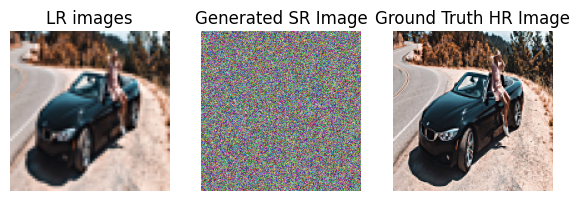

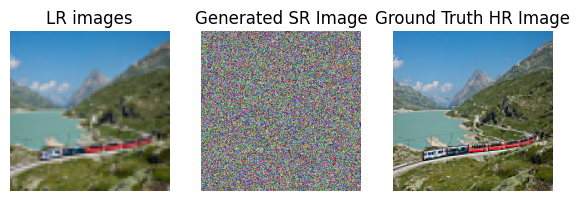

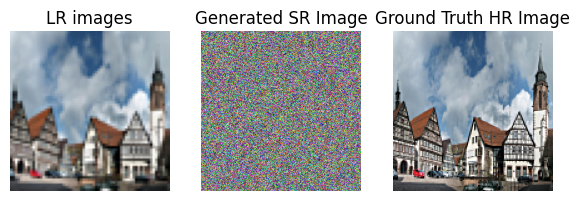

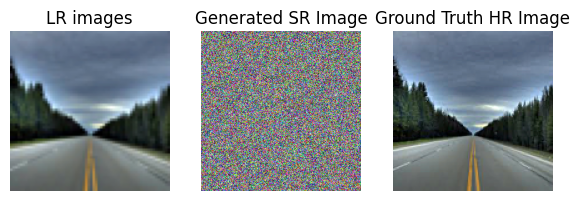

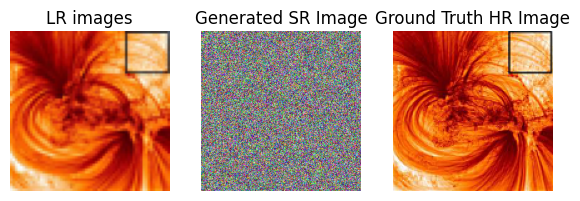

In [ ]:
#Testing
import torch
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
import numpy as np

Combined_Gan.generator.eval()
disp_img =0
#with torch.no_grad():
for i, (Hr_img,Lr_img ) in enumerate(Test_dataloader):
        Hr_img = Hr_img.to(device)
        Lr_img = Lr_img.to(device)

        Hr_img = Hr_img.to(torch.float32) #converting input to torch float
        Lr_img = Lr_img.to(torch.float32)

        Hr_img = Hr_img.permute(0, 3, 1, 2)
        Lr_img = Lr_img.permute(0, 3, 1, 2)


        Gen_img = Combined_Gan.generator(Lr_img) # generating hr

        #Gen_img = Gen_img.to(device)
        #Gen_img = Gen_img.to(torch.float32)
        #Gen_img= Gen_img.permute(0, 3, 1, 2)

        for j in range(len(Lr_img)):
          if disp_img >= 10:
                break
          lr_img = TF.to_pil_image(Lr_img[j].cpu()).convert("RGB")
          hr_img = TF.to_pil_image(Hr_img[j].cpu()).convert("RGB")
          gen_img = TF.to_pil_image(Gen_img[j].cpu()).convert("RGB")

#Postprocessing - denormalization
          lr_img = np.array(lr_img) *255.0
          hr_img = np.array(hr_img) *255.0
          gen_img = np.array(gen_img) * 255.0


          #lr_img = np.clip(lr_img, 0, 255)
          #hr_img = np.clip(hr_img, 0, 255)
          #gen_img = np.clip(gen_img, 0, 255)

          lr_img = lr_img.astype(np.uint8)
          hr_img = hr_img.astype(np.uint8)
          gen_img = gen_img.astype(np.uint8)


#reshaping
          #lr_img = lr_img.reshape(lr_img.shape[0], lr_img.shape[1], -1)
          #hr_img = hr_img.reshape(hr_img.shape[0], hr_img.shape[1], -1)
          #gen_img = gen_img.reshape(gen_img.shape[0], gen_img.shape[1], -1)



          fig, axs = plt.subplots(1, 3, figsize=(7, 7))
          axs[0].imshow(lr_img)
          axs[0].axis('off')
          axs[0].set_title('LR images')
          axs[1].imshow(gen_img)
          axs[1].axis('off')
          axs[1].set_title('Generated SR Image')
          axs[2].imshow(hr_img)
          axs[2].axis('off')
          axs[2].set_title('Ground Truth HR Image')
          plt.show()
          disp_img += 1

        if disp_img >= 10:
            break


# Training, validation, testing 10000 epochs after adding images
Learning rate adjustment, learning rate schduler with step size 1500 and early stopping

In [ ]:
#Defining loss, optimizers
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
#Defining loss
perceptual_loss = nn.MSELoss()   #perceptual calculates mean squared error
adversarial_loss = nn.BCELoss()  #binary cross entrophy

#loading models
generator = Generator()
discriminator = Discriminator()
Vgg16 = Vgg_build(hr_shape=(3, 128, 128))
Combined_Gan = FinalGan(generator, discriminator, VGG16)



#Moving models and loss to device
#Device = torch.device("cuda:0" if torch.cuda.is_available() else "gpu")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator.to(device)
discriminator.to(device)
VGG16.to(device)
Combined_Gan.to(device)
perceptual_loss.to(device)
adversarial_loss.to(device)

#Defining Optimizers for genrator and discriminator
Gen_optimizer = optim.Adam(generator.parameters(), lr = 0.0002, betas = (0.5,0.999))
Disc_optimizer = optim.Adam(discriminator.parameters(), lr = 0.0002, betas = (0.5,0.999))

#optimizer = optim.Adam(list(generator.parameters()) + list(discriminator.parameters()), lr=0.0002, betas=(0.5, 0.999))

gen_scheduler = StepLR(Gen_optimizer, step_size=1500, gamma=0.1)
disc_scheduler = StepLR(Disc_optimizer, step_size=1500, gamma=0.1)


Streaming output truncated to the last 5000 lines.
Epoch [7501/10000], Generator Loss: 1.0120
Epoch [7501/10000], Discriminator Loss: 1.2160
Epoch [7502/10000], Generator Loss: 1.0075
Epoch [7502/10000], Discriminator Loss: 1.2164
Epoch [7503/10000], Generator Loss: 1.0020
Epoch [7503/10000], Discriminator Loss: 1.2163
Epoch [7504/10000], Generator Loss: 1.0131
Epoch [7504/10000], Discriminator Loss: 1.2165
Epoch [7505/10000], Generator Loss: 1.0077
Epoch [7505/10000], Discriminator Loss: 1.2166
Epoch [7506/10000], Generator Loss: 1.0104
Epoch [7506/10000], Discriminator Loss: 1.2158
Epoch [7507/10000], Generator Loss: 1.0061
Epoch [7507/10000], Discriminator Loss: 1.2166
Epoch [7508/10000], Generator Loss: 1.0092
Epoch [7508/10000], Discriminator Loss: 1.2174
Epoch [7509/10000], Generator Loss: 1.0123
Epoch [7509/10000], Discriminator Loss: 1.2169
Epoch [7510/10000], Generator Loss: 1.0175
Epoch [7510/10000], Discriminator Loss: 1.2157
Epoch [7511/10000], Generator Loss: 1.0033
Epoch 

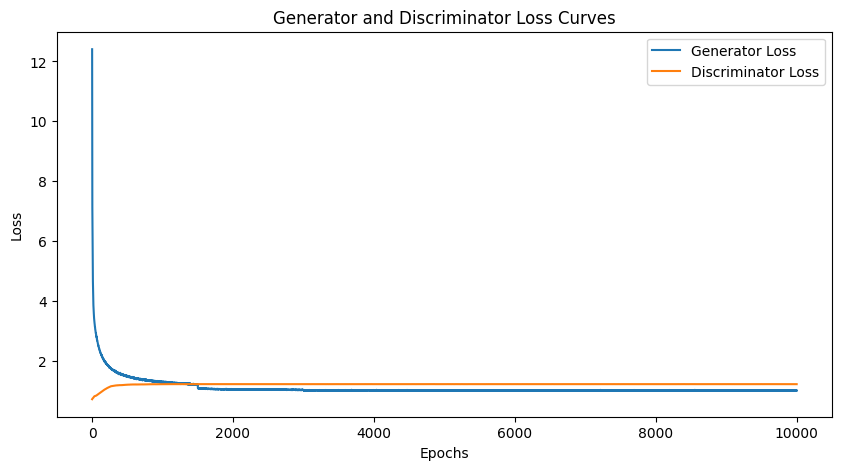

In [ ]:
#Training
import torch.nn.functional as F
import matplotlib.pyplot as pt
import torch.nn.utils as utils
epochs = 10000

#patience = 10
#best_gen_loss = float('inf')
#no_improvement_count = 0


gen_image_label = torch.zeros((Batch_size, 1),requires_grad=True).to(device)
gt_image_label = torch.ones((Batch_size, 1),requires_grad=True).to(device)


gen_loss = []
dis_loss = []

Combined_Gan.train()    #setting train mode

for epo in range(epochs):      #training over epochs
    accumulated_gen_loss = 0
    accumulated_disc_loss = 0
    for batch_ind, (Hr_img, Lr_img) in enumerate(Train_dataloader):
        Hr_img = Hr_img.to(device)
        Lr_img = Lr_img.to(device)

        Hr_img = Hr_img.to(torch.float32)
        Lr_img = Lr_img.to(torch.float32)

        Hr_img = Hr_img.permute(0, 3, 1, 2)
        Lr_img = Lr_img.permute(0, 3, 1, 2)

        Gen_optimizer.zero_grad()
        Disc_optimizer.zero_grad()

        #print(Lr_img.shape)

#generating HR images
        Generated_images = Combined_Gan.generator(Lr_img) # generating Hr images by inputing Lr images to generator
         # resizing target tensor to match the size of input tensor - got mismatch error.
        Hr_img_resized = F.interpolate(Hr_img, size=Generated_images.shape[2:], mode='bilinear', align_corners=False)

#discrminator
        Combined_Gan.discriminator.train()                 #setting Discriminator for training

        disc_loss_Genimage = adversarial_loss(Combined_Gan.discriminator(Generated_images .detach()), gen_image_label) #calculate discriminator loss on generated images
        disc_loss_gtimage = adversarial_loss(Combined_Gan.discriminator(Hr_img), gt_image_label)                        #calculate discriminator loss on ground truth hr images
        disc_loss = 0.5 * (disc_loss_Genimage + disc_loss_gtimage)   #total loss calculation

        disc_loss.backward()  #updating discriminator based on its loss
        Disc_optimizer.step()

        Combined_Gan.discriminator.eval()  # discrminator for evalution


#generator loss calculation and updating parameters
        gen_loss_genimage = adversarial_loss(Combined_Gan.discriminator(Generated_images), gt_image_label)
        gen_loss_perceptual = perceptual_loss(Combined_Gan.vgg16(Generated_images), Combined_Gan.vgg16(Hr_img_resized))
        #Gen_loss.requires_grad =True
        Gen_loss = gen_loss_genimage + 0.001 * gen_loss_perceptual

        Gen_loss.backward()
        max_norm = 1.0
        utils.clip_grad_norm_(generator.parameters(), max_norm)
        Gen_optimizer.step()

        accumulated_gen_loss += Gen_loss.item()
        accumulated_disc_loss += disc_loss.item()

    Avg_gen_loss = accumulated_gen_loss / len(Train_dataloader)
    Avg_dis_loss = accumulated_disc_loss / len(Train_dataloader)

   # if Avg_gen_loss < best_gen_loss:
       # best_gen_loss = Avg_gen_loss
        #no_improvement_count = 0

   # else:
    #    no_improvement_count += 1


    #if no_improvement_count >= patience:
     #   print("Early stopping: No improvement for {} epochs".format(patience))
      #  break

    gen_loss.append(Avg_gen_loss)
    dis_loss.append(Avg_dis_loss)

    print(f"Epoch [{epo + 1}/{epochs}], Generator Loss: {Avg_gen_loss:.4f}")
    print(f"Epoch [{epo + 1}/{epochs}], Discriminator Loss: {Avg_dis_loss:.4f}")

    gen_scheduler.step()
    disc_scheduler.step()

pt.figure(figsize=(10, 5))
pt.plot(range(1, epochs + 1), gen_loss, label='Generator Loss')
pt.plot(range(1, epochs + 1), dis_loss, label='Discriminator Loss')
pt.xlabel('Epochs')
pt.ylabel('Loss')
pt.title('Generator and Discriminator Loss Curves')
pt.legend()
pt.show()

In [ ]:
import torch

gen_weights_path = '/content/drive/MyDrive/Project/Colab Notebooks/Generator.pth'
dis_weights_path = '/content/drive/MyDrive/Project/Colab Notebooks/Discriminator.pth'
VGG_weights_path = '/content/drive/MyDrive/Project/Colab Notebooks/VGG16.pth'
combined_weights_path = '/content/drive/MyDrive/Project/Colab Notebooks/SRGAN with VGG16.pth'

generator.load_state_dict(torch.load(gen_weights_path))
discriminator.load_state_dict(torch.load(dis_weights_path))
VGG16.load_state_dict(torch.load(VGG_weights_path))
Combined_Gan.load_state_dict(torch.load(combined_weights_path))

<All keys matched successfully>

In [ ]:
#validation
import torch
import numpy as np
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from sklearn.metrics import mean_squared_error, mean_absolute_error

Combined_Gan.generator.eval()
Val_loss = 0.0
PSNR = 0.0
SSIM = 0.0
MSE = 0.0
MAE= 0.0

#with torch.no_grad():
for batch_ind, ( Hr_img, Lr_img) in enumerate(Val_dataloader):
        Hr_img = Hr_img.to(device)
        Lr_img = Lr_img.to(device)

        Hr_img = Hr_img.to(torch.float32) #converting input to torch float
        Lr_img = Lr_img.to(torch.float32)

        Hr_img = Hr_img.permute(0, 3, 1, 2)
        Lr_img = Lr_img.permute(0, 3, 1, 2)

        Gen_img = Combined_Gan.generator(Lr_img) # generating hr

        # resizing target tensor to match the size of input tensor - got mismatch error.
        Hr_img_resizedd = F.interpolate(Hr_img, size=Gen_img.shape[2:], mode='bilinear', align_corners=False)

        Val_loss += perceptual_loss(Combined_Gan.vgg16(Gen_img), Combined_Gan.vgg16(Hr_img_resizedd)).item() # calculate validation loss for features of generated and Ground truth hr

        for i in range(len(Lr_img)):
            gen_img = np.array(TF.to_pil_image(Gen_img[i].cpu())) #converting images as PIL images
            Hr_img_resizedd1 = np.array(TF.to_pil_image(Hr_img_resizedd[i]))

            if gen_img.shape != Hr_img_resizedd1.shape:
            # Resize Hr_img_resizedd to match the shape of gen_img
              Hr_img_resizedd1 = Hr_img_resizedd1.resize((gen_img.shape[1], gen_img.shape[0]))

              #print(f"Hr_img_resizedd shape: {Hr_img_resizedd.shape}")
              #print(f"gen_img shape: {gen_img.shape}")

            Psnr_score = peak_signal_noise_ratio(Hr_img_resizedd1, gen_img, data_range=255) # PSNR calculation
            PSNR += Psnr_score

            Ssim_score = structural_similarity(Hr_img_resizedd1, gen_img, channel_axis=2) # calculate SSIM
            SSIM += Ssim_score

            #reshaping images to have same dimension because got error - Found array with dim 3. None expected <= 2.
            #gen_img = np.squeeze(gen_img)
            #Hr_img_resizedd  = np.squeeze(Hr_img_resizedd )
 #flatteing image to have the shpae

            gen_imgg = gen_img.flatten()
            Hr_imgg_resizedd = Hr_img_resizedd1.flatten()

            Mse_score = mean_squared_error(Hr_imgg_resizedd, gen_imgg)  # MSE
            MSE += Mse_score

            Mae_score = mean_absolute_error(Hr_imgg_resizedd, gen_imgg)  #MAE
            MAE += Mae_score

num_sample = len(Val_dataloader.dataset) #checking no of samples
Val_loss /= num_sample
Psnr_avg_score = PSNR / num_sample
Ssim_avg_score = SSIM / num_sample
Mse_avg_score =  MSE / num_sample
Mae_avg_score =  MAE / num_sample

print(f"Validation perceptual Loss: {Val_loss :.4f}")
print(f"Average PSNR: {Psnr_avg_score:.2f}")
print(f"Average SSIM: {Ssim_avg_score:.4f}")
print(f"Average MSE: {Mse_avg_score:.2f}")
print(f"Average MAE: {Mae_avg_score:.2f}")


Validation perceptual Loss: 74.2309
Average PSNR: 7.64
Average SSIM: 0.0053
Average MSE: 105.50
Average MAE: 127.49


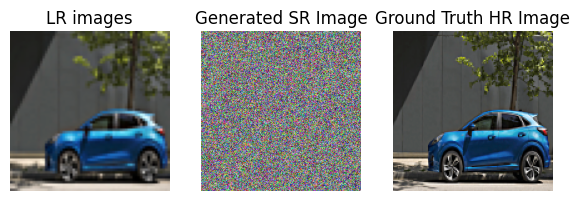

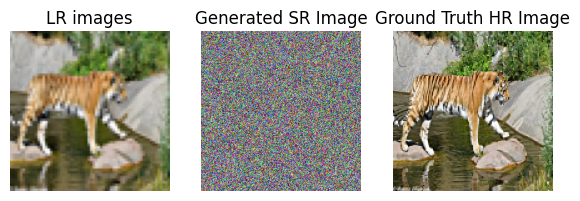

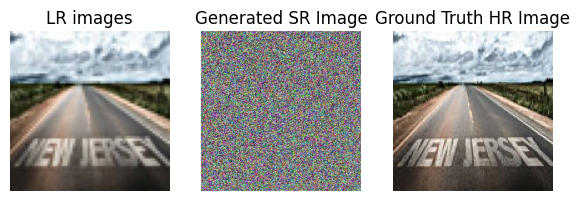

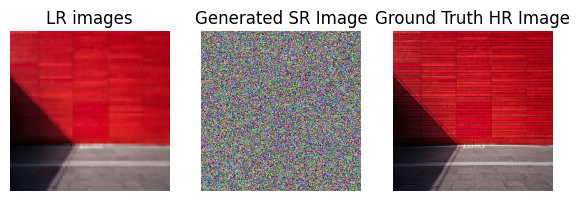

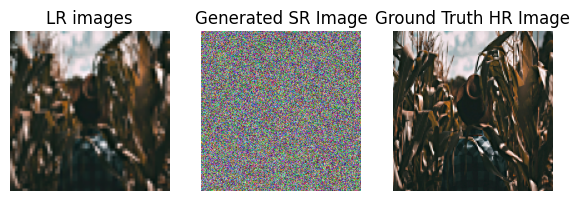

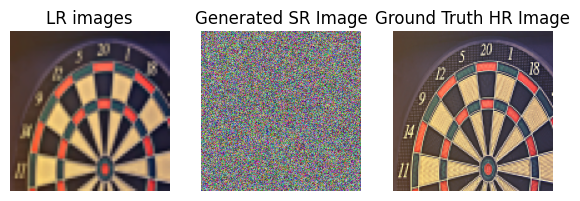

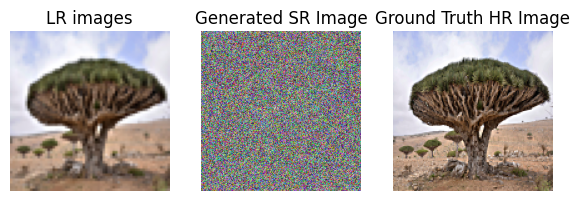

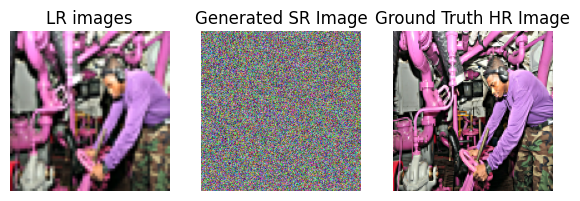

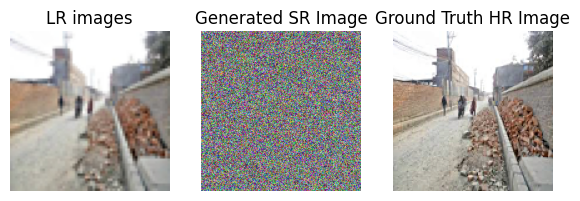

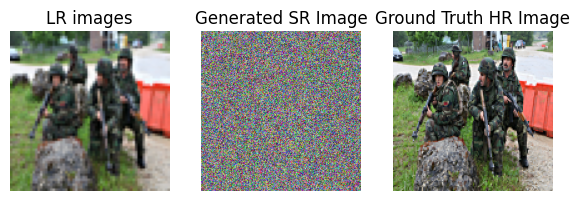

In [ ]:
#Testing
import torch
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
import numpy as np

Combined_Gan.generator.eval()
disp_img =0
#with torch.no_grad():
for i, (Hr_img,Lr_img ) in enumerate(Test_dataloader):
        Hr_img = Hr_img.to(device)
        Lr_img = Lr_img.to(device)

        Hr_img = Hr_img.to(torch.float32) #converting input to torch float
        Lr_img = Lr_img.to(torch.float32)

        Hr_img = Hr_img.permute(0, 3, 1, 2)
        Lr_img = Lr_img.permute(0, 3, 1, 2)


        Gen_img = Combined_Gan.generator(Lr_img) # generating hr

        #Gen_img = Gen_img.to(device)
        #Gen_img = Gen_img.to(torch.float32)
        #Gen_img= Gen_img.permute(0, 3, 1, 2)

        for j in range(len(Lr_img)):
          if disp_img >= 10:
                break
          lr_img = TF.to_pil_image(Lr_img[j].cpu()).convert("RGB")
          hr_img = TF.to_pil_image(Hr_img[j].cpu()).convert("RGB")
          gen_img = TF.to_pil_image(Gen_img[j].cpu()).convert("RGB")

#Postprocessing - denormalization
          lr_img = np.array(lr_img) *255.0
          hr_img = np.array(hr_img) *255.0
          gen_img = np.array(gen_img) * 255.0


          #lr_img = np.clip(lr_img, 0, 255)
          #hr_img = np.clip(hr_img, 0, 255)
          #gen_img = np.clip(gen_img, 0, 255)

          lr_img = lr_img.astype(np.uint8)
          hr_img = hr_img.astype(np.uint8)
          gen_img = gen_img.astype(np.uint8)


#reshaping
          #lr_img = lr_img.reshape(lr_img.shape[0], lr_img.shape[1], -1)
          #hr_img = hr_img.reshape(hr_img.shape[0], hr_img.shape[1], -1)
          #gen_img = gen_img.reshape(gen_img.shape[0], gen_img.shape[1], -1)



          fig, axs = plt.subplots(1, 3, figsize=(7, 7))
          axs[0].imshow(lr_img)
          axs[0].axis('off')
          axs[0].set_title('LR images')
          axs[1].imshow(gen_img)
          axs[1].axis('off')
          axs[1].set_title('Generated SR Image')
          axs[2].imshow(hr_img)
          axs[2].axis('off')
          axs[2].set_title('Ground Truth HR Image')
          plt.show()
          disp_img += 1

        if disp_img >= 10:
            break


# Saving the models for future use
once saved there is no need to train again

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
torch.save(Combined_Gan.generator.state_dict(), '/content/drive/MyDrive/Project/Colab Notebooks/Generator.pth')
torch.save(Combined_Gan.discriminator.state_dict(), '/content/drive/MyDrive/Project/Colab Notebooks/Discriminator.pth')
torch.save(Combined_Gan.vgg16.state_dict(), '/content/drive/MyDrive/Project/Colab Notebooks/VGG16.pth')
torch.save(Combined_Gan.state_dict(), '/content/drive/MyDrive/Project/Colab Notebooks/SRGAN with VGG16.pth')